# Experimentación Generación Molecular con MolGAN

In [77]:
'''
Lo primero que debemos hacer es importar (e instalar) las librerías necesarias. En este caso, haremos uso de:
* DeepChem
* TensorFlow
* RDKit
* Pandas
* Numpy
* Matplotlib
'''
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import os
from collections import OrderedDict

import deepchem as dc
import deepchem.models
from deepchem.models import BasicMolGANModel as MolGAN
from deepchem.models.optimizers import ExponentialDecay
import tensorflow as tf
from tensorflow import one_hot
from rdkit import Chem
from rdkit.Chem.Draw import IPythonConsole
from rdkit.Chem import Draw
from rdkit.Chem import Lipinski

from deepchem.feat.molecule_featurizers.molgan_featurizer import GraphMatrix

# Introducción

En este notebook vamos a realizar la experimentación para la generación de moléculas con un dataset muy concreto haciendo uso de una red adversaria generativa MolGAN. La implementaremos haciendo uso de DeepChem, una librería de python centrada en la quimioinformática

In [78]:
def smiles2graph(dataset, num_atomos=12, tipo_atomos=[0, 5, 6, 7, 8, 9, 11, 12, 13, 14]):
    """
    Convierte los SMILES en representaciones de grafos utilizando el featurizador MolGanFeaturizer.

    Parámetros:
    - dataset: DataFrame que contiene una columna 'smiles' con las SMILES de las moléculas.
    - num_atomos (int): Número máximo de átomos permitidos en una molécula.
    - tipo_atomos (lista de enteros): Lista de tipos de átomos permitidos en las moléculas.

    Retorna:
    - Una lista de representaciones de grafos (GraphMatrix) de las moléculas válidas según los parámetros dados.
    """
    # Crear objeto Featurizer
    feat = dc.feat.MolGanFeaturizer(max_atom_count=num_atomos, atom_labels=tipo_atomos)
    # Obtener SMILES del DataFrame
    smiles = dataset['smiles'].values
    # Filtrar SMILES por número de átomos
    filtered_smiles = [x for x in smiles if Chem.MolFromSmiles(x).GetNumAtoms() < num_atomos]
    # Featurizar las moléculas
    features = feat.featurize(filtered_smiles)
    # Obtener índices de las moléculas válidas
    indices = [i for i, data in enumerate(features) if type(data) is GraphMatrix]
    # Filtrar por índices obtenidos
    features = [features[i] for i in indices]
    print("Número de moléculas obtenidas tras aplicar el featurizador:", len(features))
    
    return features, feat


def fit_generacion_GAN(lista_grafos_moleculares, epocas=25, pasos_gen=1/5, num_atomos=12, num_muestras_generadas=10000):
    """
    Entrena un modelo de generación GAN (MolGAN) utilizando una lista de grafos moleculares.

    Parámetros:
    - lista_grafos_moleculares (list): Lista de objetos que representan grafos moleculares.
    - epocas (int): Número de épocas de entrenamiento.
    - pasos_gen (float): Número de pasos del generador por cada paso del discriminador.
    - num_atomos (int): Número máximo de átomos permitidos en una molécula.
    - num_muestras_generadas (: Número de muestras a generar al final del entrenamiento.

    Retorna:
    - Un conjunto de muestras generadas por el generador del modelo GAN.
    """
    # Definir función para generar e iterar sobre lotes de datos
    def iterbatches(epochs):
        for i in range(epochs):
            for batch in dataset.iterbatches(batch_size=gan.batch_size, pad_batches=True):
                adjacency_tensor = one_hot(batch[0], gan.edges)
                node_tensor = one_hot(batch[1], gan.nodes)
                yield {gan.data_inputs[0]: adjacency_tensor, gan.data_inputs[1]: node_tensor}
    # Crear modelo MolGAN
    gan = MolGAN(learning_rate=ExponentialDecay(0.001, 0.9, 5000), vertices=num_atomos)
    # Creamos la matriz de adyacencia y la de característica de nodos
    dataset = dc.data.NumpyDataset([x.adjacency_matrix for x in lista_grafos_moleculares],
                               [x.node_features for x in lista_grafos_moleculares])
    # Entrenar el modelo GAN
    gan.fit_gan(iterbatches(epocas), generator_steps=pasos_gen, checkpoint_interval=5000)
    # Generar muestras con el generador del modelo GAN
    return gan.predict_gan_generator(num_muestras_generadas)


def graph2smiles(lista_grafos_moleculares, feat):
    """
    Convierte representaciones de grafos en SMILES utilizando un objeto Featurizer.

    Parámetros:
    - lista_grafos_moleculares (list): Lista de objetos que representan grafos moleculares.
    - feat: Objeto Featurizer utilizado para la conversión de grafos a moléculas en formato RDKit.

    Retorna:
    - Lista de SMILES correspondientes a las moléculas generadas a partir de los grafos.
    """
    # Filtrar moléculas válidas
    moleculas_rdkit = list(filter(lambda x: x is not None, feat.defeaturize(lista_grafos_moleculares)))
    print("{} moleculas validas".format(len(moleculas_rdkit)))
    # Convertir RDMol a SMILES
    moleculas_smiles = [Chem.MolToSmiles(m) for m in moleculas_rdkit]
    # Obtener moléculas únicas
    moleculas_smiles_unicas = list(OrderedDict.fromkeys(moleculas_smiles))
    print("{} moleculas validas únicas".format(len(moleculas_smiles_unicas)))
    
    return moleculas_smiles_unicas


def mostrarSmiles(lista_smiles, molsPorFila=5):
    """
    Muestra los SMILES en formato de cuadrícula con leyendas que representan el valor QED.

    Args:
    - lista_smiles (list): Una lista de SMILES de moléculas.
    - molsPorFila (int, opcional): Número de moléculas por fila en la cuadrícula. Por defecto, 5.

    Returns:
    Una imagen que muestra las moléculas en formato de cuadrícula con leyendas QED.
    """
    
    # Convertir SMILES a RDMol
    moleculas_rdkit = [Chem.MolFromSmiles(x) for x in lista_smiles]
    # Calcular los valores QED
    valores_qed = calculoDescriptores(lista_smiles, ["qed"])
    # Redondear los valores QED a dos cifras significativas
    leyendas_qed = [str(round(qed[0], 2)) for qed in valores_qed]
    # Crear la imagen de la cuadrícula con leyendas QED
    img = Draw.MolsToGridImage(moleculas_rdkit[0:len(moleculas_rdkit)], molsPerRow=molsPorFila, subImgSize=(250, 250),
                               maxMols=len(moleculas_rdkit), legends=leyendas_qed, returnPNG=False)

    return img

def smiles2dataset(lista_smiles):
    """
    Convierte una lista de SMILES en un DataFrame de pandas con propiedades químicas calculadas.

    Args:
    - lista_smiles (list): Una lista de SMILES de moléculas.

    Returns:
    Un DataFrame de pandas que contiene información química calculada para cada molécula, incluyendo
    SMILES, Peso Molecular, LogP y QED.
    """
    # Calcular las propiedades químicas
    valor_propiedades = calculoDescriptores(lista_smiles, ["ExactMolWt", "MolLogP", "qed"])
    # Transponer las propiedades para organizar por columna
    propiedades_transpuestas = list(map(list, zip(*valor_propiedades)))
    # Crear un diccionario para construir el DataFrame
    dicc = {
        'SMILES': lista_smiles,
        'Peso Molecular': [(round(prop,3)) for prop in propiedades_transpuestas[0]],
        'LogP': [(round(prop,3)) for prop in propiedades_transpuestas[1]],
        'QED': [(round(prop,3)) for prop in propiedades_transpuestas[2]],
        "Lipinski" : [cumple_lipinski(smiles) for smiles in lista_smiles]
    }
    
    # Crear el DataFrame de pandas
    dataframe_resultante = pd.DataFrame(dicc)
    return dataframe_resultante

In [79]:
#Funciones de propiedades y descriptores

def calculoDescriptores(listaSMILES, listaDescriptores):
    """
    Calcula descriptores químicos específicos para una lista de moléculas dadas mediante sus SMILES.

    Args:
    - listaSMILES (list): Una lista de SMILES de moléculas.
    - listaDescriptores (list): Una lista de nombres de descriptores químicos a calcular.

    Returns:
    Un array de numpy con los valores de los descriptores calculados para las moléculas dadas.
    """
    rdkit_featurizer = dc.feat.RDKitDescriptors(descriptors=listaDescriptores)
    features = rdkit_featurizer(listaSMILES)
    return features

def cumple_lipinski(smiles):
    """
    Verifica si una molécula dada, representada por su SMILES, cumple con la Regla de cinco de Lipinski.

    Args:
    - smiles (str): SMILES de la molécula a ser evaluada.

    Returns:
    True si la molécula cumple con la Regla de cinco de Lipinski, False en caso contrario.
    """
    moleculaRDKit = Chem.MolFromSmiles(smiles)

    # Calcular el número de aceptores y donadores de hidrógeno
    aceptores_hidrogeno = Lipinski.NumHAcceptors(moleculaRDKit)
    donadores_hidrogeno = Lipinski.NumHDonors(moleculaRDKit)
    
    # Calcular el peso molecular y LogP
    rdkit_featurizer = dc.feat.RDKitDescriptors(descriptors=["ExactMolWt", "MolLogP"])
    peso_molecular, logP = rdkit_featurizer(moleculaRDKit)[0]

    # Verificar si cumple con los criterios de la Regla de cinco de Lipinski
    if (aceptores_hidrogeno <= 10) and (donadores_hidrogeno <= 5) and (peso_molecular < 500) and (logP < 5.3):
        return True
    else:
        return False

In [80]:
def generar_moleculas_pipeline(dataset, num_atomos=12, tipo_atomos=[0, 5, 6, 7, 8, 9, 11, 12, 13, 14], 
                                epocas=25, pasos_gen=1/5, num_muestras_generadas=10000, mols_por_fila=5):
    """
    Pipeline para generar moléculas a partir de un conjunto de datos de SMILES.

    Parámetros:
    - dataset (DataFrame): DataFrame que contiene una columna 'smiles' con las SMILES de las moléculas.
    - num_atomos (int): Número máximo de átomos permitidos en una molécula.
    - tipo_atomos (lista de enteros): Lista de tipos de átomos permitidos en las moléculas.
    - epocas (int): Número de épocas de entrenamiento.
    - pasos_gen (float): Número de pasos del generador por cada paso del discriminador.
    - num_muestras_generadas (int): Número de muestras a generar al final del entrenamiento.
    - mols_por_fila (int): Número de moléculas por fila en la cuadrícula al mostrarlas.

    Retorna:
    - Una imagen que muestra las moléculas generadas en formato de cuadrícula.
    """

    # Paso 1: Convertir SMILES en representaciones de grafos
    features, feat = smiles2graph(dataset, num_atomos)

    # Paso 2: Entrenar un modelo de generación GAN
    lista_grafos_moleculares = fit_generacion_GAN(features, epocas, pasos_gen, num_atomos, num_muestras_generadas)

    # Paso 3: Convertir representaciones de grafos en SMILES
    lista_smiles = graph2smiles(lista_grafos_moleculares, feat)
    if(len(lista_smiles) != 0):
        return lista_smiles
    else:
        print("No se han generado moléculas válidas")

## Dataset

La librería de DeepChem se empaqueta junto con el conjunto de datos MoleculeNet. MoleculeNet ha recopilado una amplia gama de conjuntos de datos y los ha cargado en objetos dc.data.Dataset de DeepChem para facilitar su uso a los usuarios. Para ver los distintos datasets que contiene MoleculeNet consultar: https://deepchem.readthedocs.io/en/latest/api_reference/moleculenet.html

El conjunto de datos utilizado para el entrenamiento del modelo es de un conjunto de compuestos los cuales se probó la capacidad para inhibir la replicación del VIH conteniendo más de 40,000 compuestos. Fue introducido por el Programa de Terapéutica de Medicamentos (DTP) en la Evaluación Antiviral del SIDA. Los resultados del cribado fueron evaluados y clasificados en tres categorías: confirmado inactivo (CI), confirmado activo (CA) y confirmado moderadamente activo (CM). Posteriormente, se combinaron las dos últimas etiquetas, convirtiéndolo en una tarea de clasificación entre inactivo (CI) y activo (CA y CM). 

Para más información sobre este dataset, consultar: 

https://deepchem.readthedocs.io/en/latest/api_reference/moleculenet.html#hiv-datase

https://wiki.nci.nih.gov/display/NCIDTPdata/AIDS+Antiviral+Screen+Data.

## Dataset Tox21

In [81]:
tasks, datasets, transformers = dc.molnet.load_tox21() #Llamamos al objeto molnet.load_dataset dentro de la librería DeepChem
df_tox21 = pd.DataFrame(data={'smiles': datasets[0].ids})

### Experimento 1: Tox21, 25 epocas, 1/5 pasos generador, 12 átomos

In [ ]:
lista_smiles = generar_moleculas_pipeline(df_tox21, epocas = 25, pasos_gen = 1/5, num_atomos = 12)

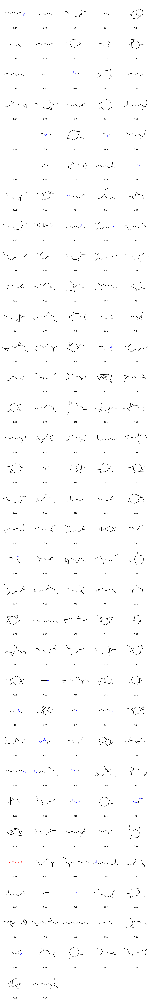

In [83]:
mostrarSmiles(lista_smiles)

In [89]:
df = smiles2dataset(lista_smiles)
print(np.mean(df["QED"].values)) #Media de los valores de QED
print(np.mean(df["LogP"].values)) #Media de los valores de LogP

0.5173209876543211
2.8633456790123453


In [90]:
nombre_archivo = r"DatosExperimentacion\tox21_12_25_5.csv"
df.to_csv(nombre_archivo, index=False)

In [121]:
#Ejemplo de CSV que generamos
df

,SMILES,Peso Molecular,LogP,QED,Lipinski
0,BC(C)C(N)COC(O)O,147.107,-1.960,0.318,True
1,BC1COC(O)(O)OCC1(C)O,176.086,-2.198,0.288,True
2,BC1(C)CC12OC2OC(O)(O)O,174.070,-2.098,0.254,True
3,BC(C)C(C)(O)COC(O)(O)O,178.101,-2.216,0.289,True
4,CC12BC1C2(O)COC(O)(O)O,174.070,-2.247,0.286,True
5,BC(C)C(B)COC(O)O,144.113,-1.866,0.359,True
6,BC(C)C(O)COC(O)O,148.091,-1.926,0.321,True
7,BC1CC(OC(O)(O)O)C1(C)O,176.086,-2.464,0.276,True
8,BC1(COC(O)(O)O)CC12BC2,170.092,-2.186,0.332,True
9,BC(C)C(B)(C)COC(O)O,158.129,-1.476,0.387,True


### Experimento 2: Tox21, 25 epocas, 1/5 pasos generador, 14 átomos

In [ ]:
lista_smiles = generar_moleculas_pipeline(df_tox21, epocas = 25, pasos_gen = 1/5, num_atomos = 14)

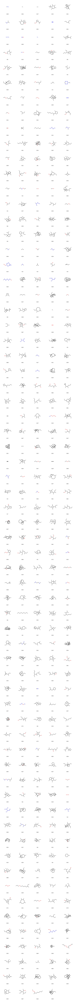

In [100]:
mostrarSmiles(lista_smiles)

In [105]:
df = smiles2dataset(lista_smiles)
print(np.mean(df["QED"].values)) #Media de los valores de QED
print(np.mean(df["LogP"].values)) #Media de los valores de LogP

0.5171003039513677
2.4266079027355625


In [106]:
nombre_archivo = r"DatosExperimentacion\tox21_14_25_5.csv"
df.to_csv(nombre_archivo, index=False)

### Experimento 3: Tox21, 60 epocas, 1/4 pasos generador, 14 átomos

In [ ]:
lista_smiles = generar_moleculas_pipeline(df_tox21, epocas = 60, pasos_gen = 1/4, num_atomos = 14)

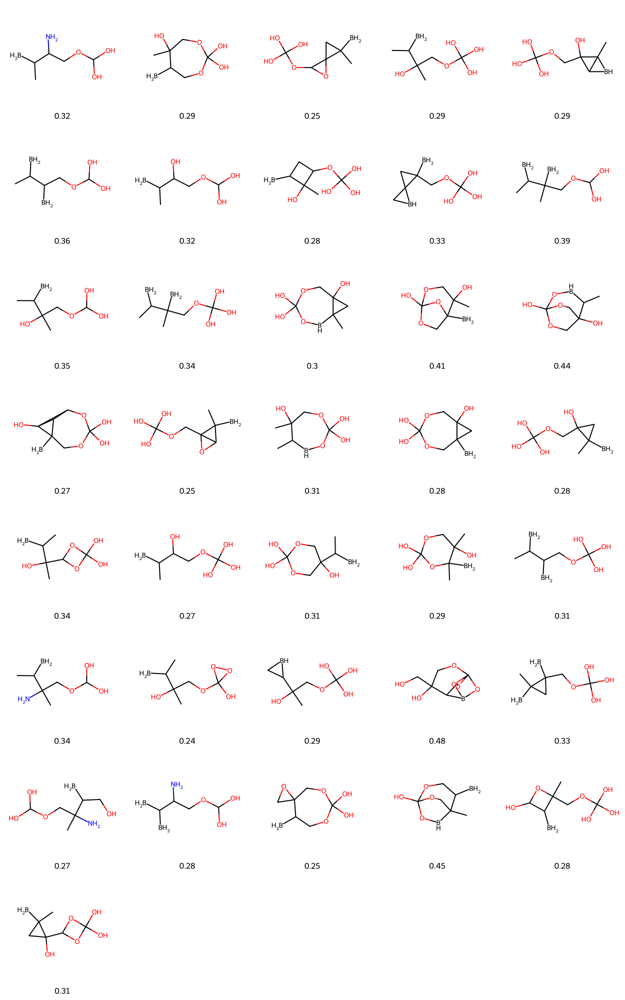

In [119]:
mostrarSmiles(lista_smiles)

In [120]:
df = smiles2dataset(lista_smiles)
print(np.mean(df["QED"].values)) #Media de los valores de QED
print(np.mean(df["LogP"].values)) #Media de los valores de LogP

0.3164444444444444
-2.1194722222222224


In [122]:
nombre_archivo = r"DatosExperimentacion\tox21_14_50_5_p2.csv"
df.to_csv(nombre_archivo, index=False)

### Experimento 4: Tox21, 16 átomos, 60 épocas, pasos generador 1/5

In [ ]:
lista_smiles = generar_moleculas_pipeline(df_tox21, epocas = 60, pasos_gen = 1/5, num_atomos = 16)

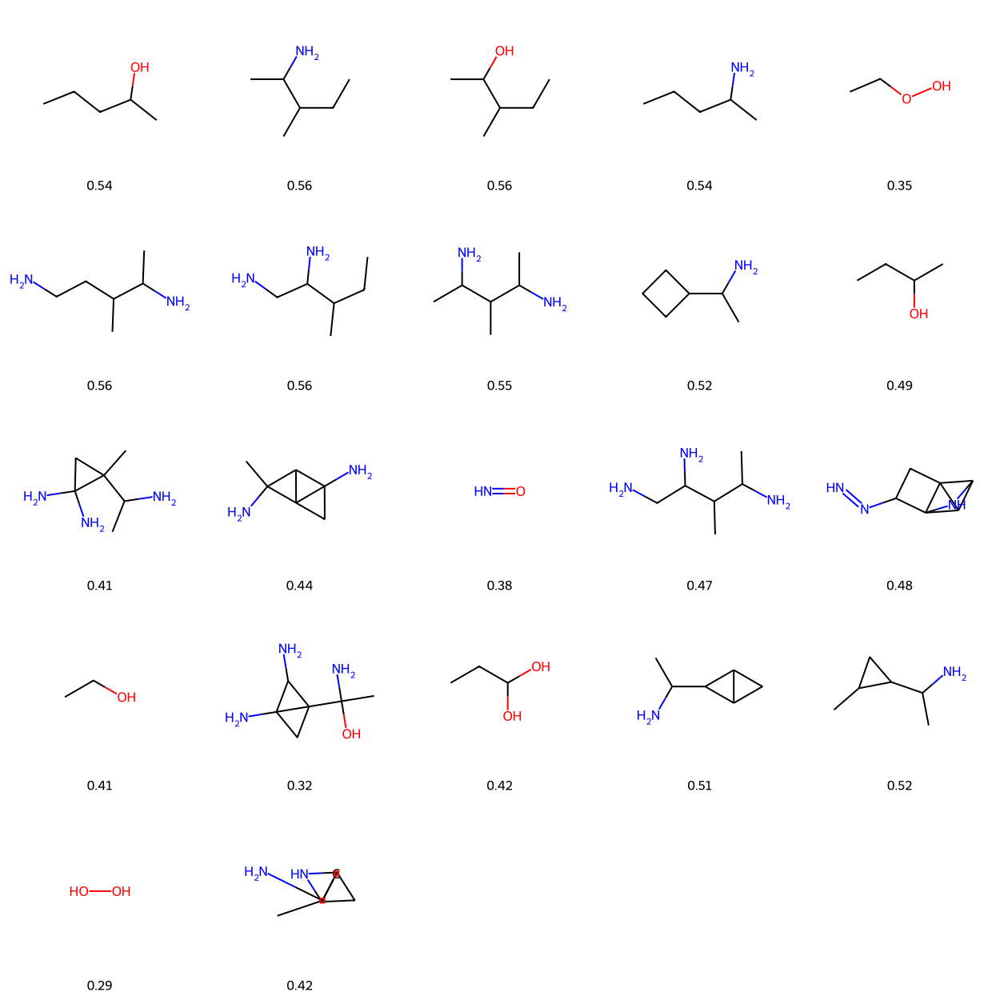

In [124]:
mostrarSmiles(lista_smiles)

In [125]:
df = smiles2dataset(lista_smiles)
print(np.mean(df["QED"].values)) #Media de los valores de QED
print(np.mean(df["LogP"].values)) #Media de los valores de LogP

0.46763636363636363
0.2705909090909091


In [126]:
nombre_archivo = r"DatosExperimentacion\tox21_16_60_5.csv"
df.to_csv(nombre_archivo, index=False)

### Experimento 5: Tox21, 16 átomos, 70 épocas, pasos generador 1/4

In [ ]:
lista_smiles = generar_moleculas_pipeline(df_tox21, epocas = 70, pasos_gen = 1/4, num_atomos = 16)

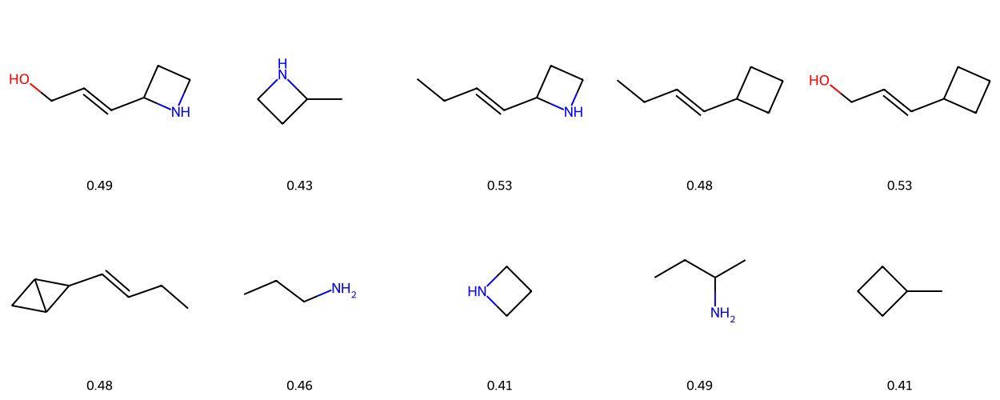

In [282]:
mostrarSmiles(lista_smiles)

In [283]:
df = smiles2dataset(lista_smiles)
print(np.mean(df["QED"].values)) #Media de los valores de QED
print(np.mean(df["LogP"].values)) #Media de los valores de LogP

0.4713
1.077


In [284]:
nombre_archivo = r"DatosExperimentacion\tox21_16_70_4.csv"
df.to_csv(nombre_archivo, index=False)

### Experimento 6: Tox21, 16 átomos, 80 épocas, pasos generador 1/4

In [ ]:
lista_smiles = generar_moleculas_pipeline(df_tox21, epocas = 80, pasos_gen = 1/4, num_atomos = 16)

### Experimento 7: Tox21, 18 átomos, 65 épocas, pasos generador 1/5

In [ ]:
lista_smiles = generar_moleculas_pipeline(df_tox21, epocas = 65, pasos_gen = 1/5, num_atomos = 18)

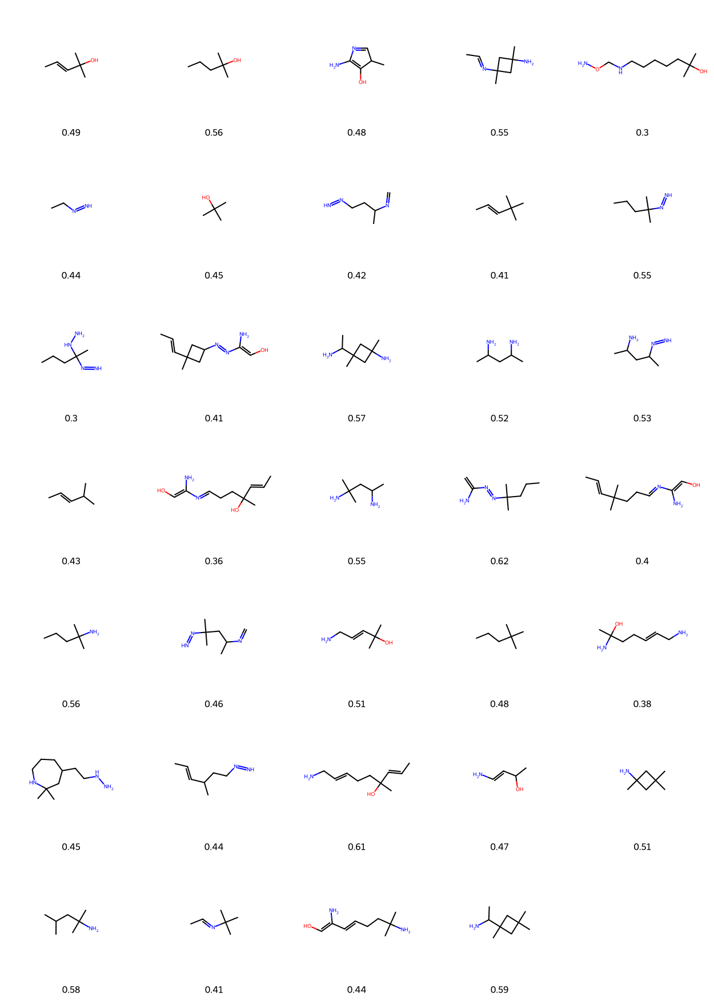

In [139]:
mostrarSmiles(lista_smiles)

In [140]:
df = smiles2dataset(lista_smiles)
print(np.mean(df["QED"].values)) #Media de los valores de QED
print(np.mean(df["LogP"].values)) #Media de los valores de LogP

0.47747058823529415
1.4559117647058826


In [141]:
nombre_archivo = r"DatosExperimentacion\tox21_18_65_5.csv"
df.to_csv(nombre_archivo, index=False)

### Experimento 8: Tox21, 18 átomos, 75 épocas, pasos generador 1/4

In [ ]:
lista_smiles = generar_moleculas_pipeline(df_tox21, epocas = 75, pasos_gen = 1/4, num_atomos = 18)

In [ ]:
mostrarSmiles(lista_smiles)

In [ ]:
df = smiles2dataset(lista_smiles)
print(np.mean(df["QED"].values)) #Media de los valores de QED
print(np.mean(df["LogP"].values)) #Media de los valores de LogP

In [ ]:
nombre_archivo = r"DatosExperimentacion\tox21_18_75_4.csv"
df.to_csv(nombre_archivo, index=False)

### Experimento 9: Tox21, 20 átomos, 80 épocas, pasos generador 1/5

In [ ]:
lista_smiles = generar_moleculas_pipeline(df_tox21, epocas = 80, pasos_gen = 1/5, num_atomos = 20)

In [ ]:
nombre_archivo = r"DatosExperimentacion\tox21_18_75_4.csv"
df.to_csv(nombre_archivo, index=False)

### Experimento 10: Tox21, 22 átomos, 100 épocas, pasos generador 1/5

In [ ]:
lista_smiles = generar_moleculas_pipeline(df_tox21, epocas = 100, pasos_gen = 1/5, num_atomos = 22)

### Dataset HIV

In [152]:
tasks, datasets, transformers = dc.molnet.load_hiv() #Llamamos al objeto molnet.load_dataset dentro de la librería DeepChem
df_hiv = pd.DataFrame(data={'smiles': datasets[0].ids})

### Experimento 11: HIV, 12 átomos, 25 épocas, pasos generador 1/5

In [ ]:
lista_smiles = generar_moleculas_pipeline(df_hiv, epocas = 25, pasos_gen = 1/5, num_atomos = 12)

In [157]:
len(lista_smiles)

49

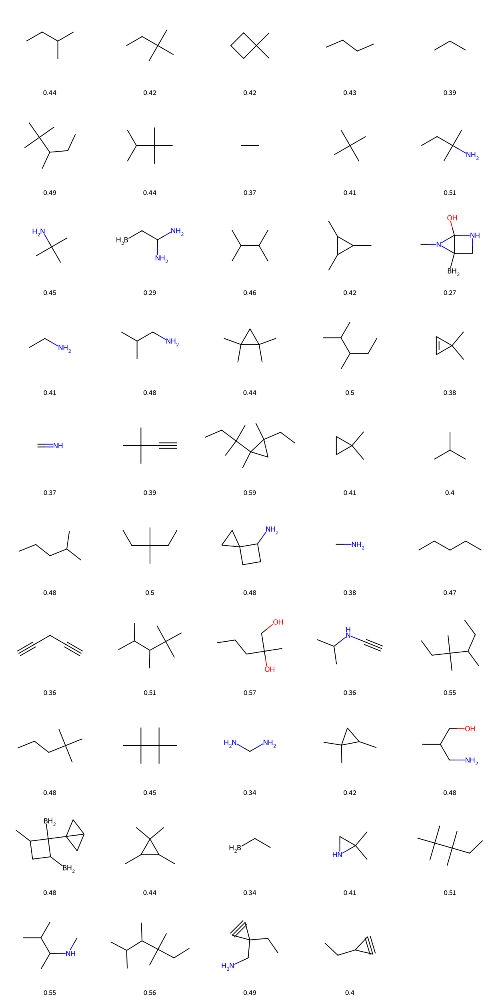

In [156]:
mostrarSmiles(lista_smiles)

In [158]:
df = smiles2dataset(lista_smiles)
print(np.mean(df["QED"].values)) #Media de los valores de QED
print(np.mean(df["LogP"].values)) #Media de los valores de LogP

0.44026530612244896
1.5028163265306123


In [159]:
nombre_archivo = r"DatosExperimentacion\hiv_12_25_5.csv"
df.to_csv(nombre_archivo, index=False)

### Experimento 12: HIV, 12 átomos, 50 épocas, pasos generador 1/5

In [ ]:
lista_smiles = generar_moleculas_pipeline(df_hiv, epocas = 50, pasos_gen = 1/5, num_atomos = 12)

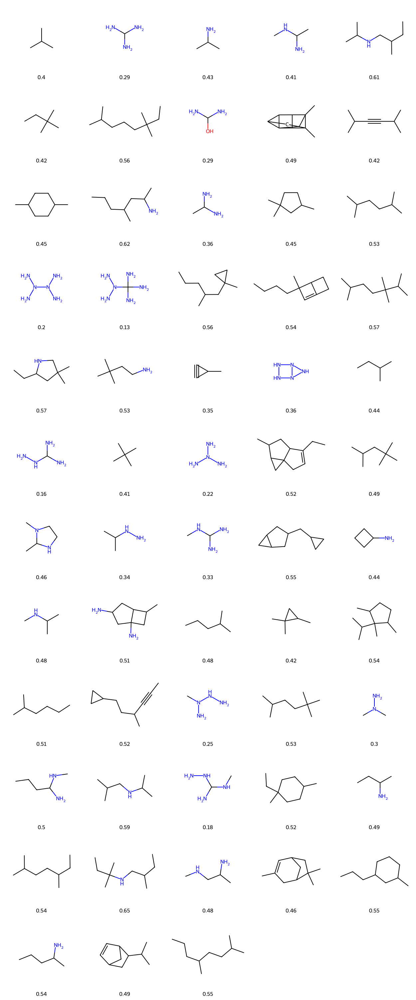

In [162]:
mostrarSmiles(lista_smiles)

In [163]:
df = smiles2dataset(lista_smiles)
print(np.mean(df["QED"].values)) #Media de los valores de QED
print(np.mean(df["LogP"].values)) #Media de los valores de LogP

0.4482241379310345
1.3348793103448275


In [164]:
nombre_archivo = r"DatosExperimentacion\hiv_12_50_5.csv"
df.to_csv(nombre_archivo, index=False)

### Experimento 13: HIV, 25 epocas, 1/5 pasos generador, 14 átomos

In [ ]:
lista_smiles = generar_moleculas_pipeline(df_hiv, epocas = 25, pasos_gen = 1/5, num_atomos = 14)

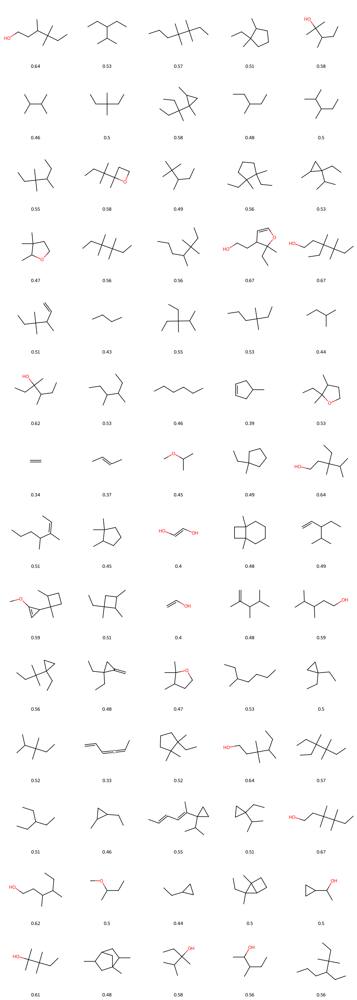

In [166]:
mostrarSmiles(lista_smiles)

In [168]:
df = smiles2dataset(lista_smiles)
print(np.mean(df["QED"].values)) #Media de los valores de QED
print(np.mean(df["LogP"].values)) #Media de los valores de LogP

0.5192999999999999
2.622657142857143


In [171]:
nombre_archivo = r"DatosExperimentacion\hiv_14_25_5.csv"
df.to_csv(nombre_archivo, index=False)

### Experimento 14: HIV, 50 epocas, 1/5 pasos generador, 14 átomos

In [ ]:
lista_smiles = generar_moleculas_pipeline(df_hiv, epocas = 50, pasos_gen = 1/5, num_atomos = 14)

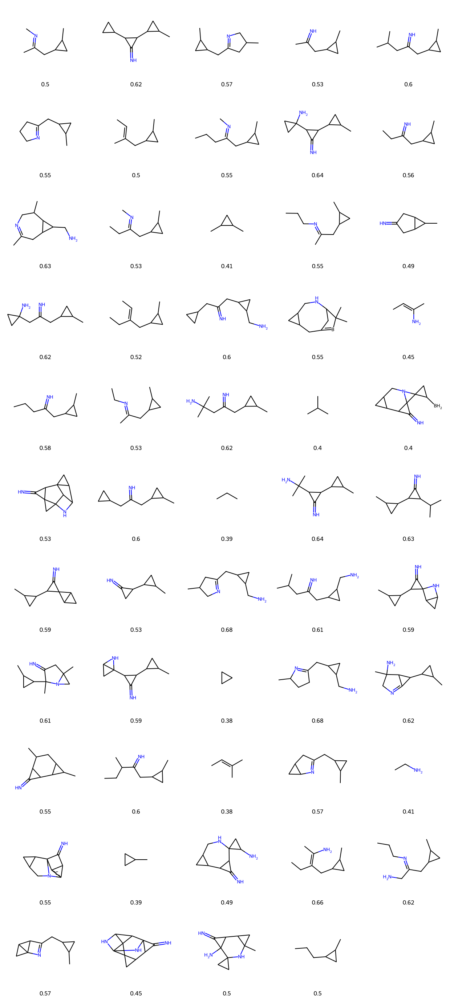

In [170]:
mostrarSmiles(lista_smiles)

In [173]:
df = smiles2dataset(lista_smiles)
print(np.mean(df["QED"].values)) #Media de los valores de QED
print(np.mean(df["LogP"].values)) #Media de los valores de LogP

0.5437777777777778
1.781925925925926


In [174]:
nombre_archivo = r"DatosExperimentacion\hiv_14_50_5.csv"
df.to_csv(nombre_archivo, index=False)

### Experimento 15: HIV, 50 epocas, 1/5 pasos generador, 16 átomos

In [ ]:
lista_smiles = generar_moleculas_pipeline(df_hiv, epocas = 50, pasos_gen = 1/5, num_atomos = 16)

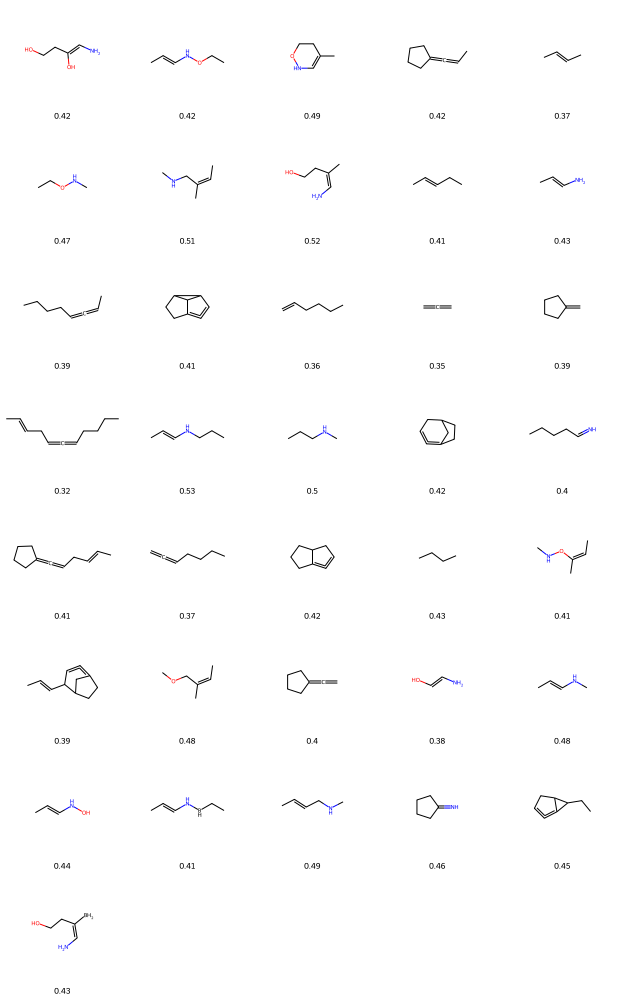

In [177]:
mostrarSmiles(lista_smiles)

In [180]:
df = smiles2dataset(lista_smiles)
print(np.mean(df["QED"].values)) #Media de los valores de QED
print(np.mean(df["LogP"].values)) #Media de los valores de LogP

0.42794444444444446
1.4900555555555552


In [179]:
nombre_archivo = r"DatosExperimentacion\hiv_16_50_5.csv"
df.to_csv(nombre_archivo, index=False)

### Experimento 16: HIV, 50 epocas, 1/8 pasos generador, 16 átomos

In [ ]:
lista_smiles = generar_moleculas_pipeline(df_hiv, epocas = 50, pasos_gen = 1/8, num_atomos = 16)

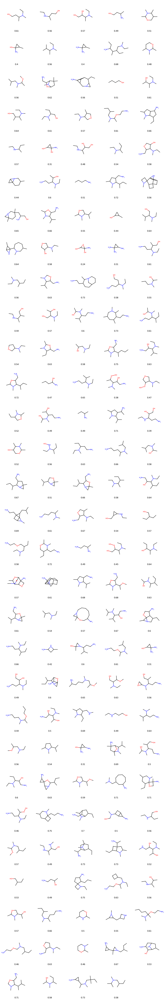

In [184]:
mostrarSmiles(lista_smiles)

In [185]:
df = smiles2dataset(lista_smiles)
print(np.mean(df["QED"].values)) #Media de los valores de QED
print(np.mean(df["LogP"].values)) #Media de los valores de LogP

0.5769060402684564
0.6579731543624162


In [186]:
nombre_archivo = r"DatosExperimentacion\hiv_16_50_8.csv"
df.to_csv(nombre_archivo, index=False)

### Experimento 17: HIV, 70 epocas, 1/5 pasos generador, 18 átomos

In [ ]:
lista_smiles = generar_moleculas_pipeline(df_hiv, epocas = 70, pasos_gen = 1/5, num_atomos = 18)

In [ ]:
mostrarSmiles(lista_smiles)

In [ ]:
df = smiles2dataset(lista_smiles)
print(np.mean(df["QED"].values)) #Media de los valores de QED
print(np.mean(df["LogP"].values)) #Media de los valores de LogP

### Experimento 18: HIV, 100 epocas, 1/6 pasos generador, 18 átomos

In [ ]:
lista_smiles = generar_moleculas_pipeline(df_hiv, epocas = 100, pasos_gen = 1/6, num_atomos = 18)

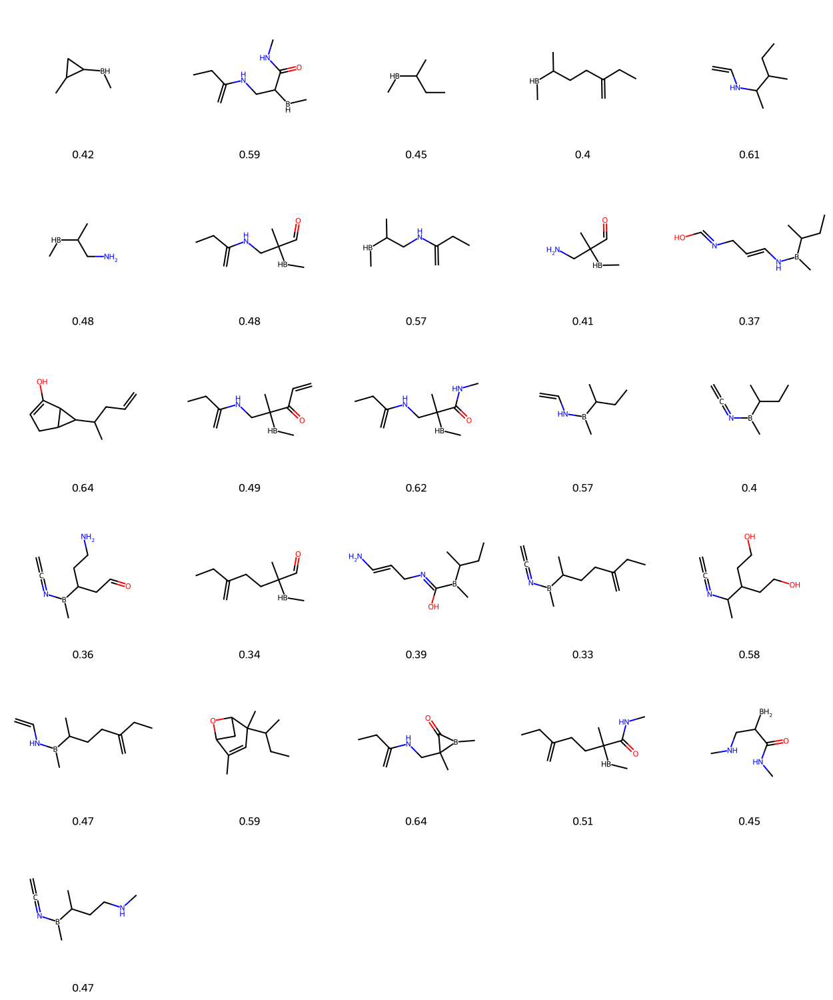

In [192]:
mostrarSmiles(lista_smiles)

In [194]:
df = smiles2dataset(lista_smiles)
print(np.mean(df["QED"].values)) #Media de los valores de QED
print(np.mean(df["LogP"].values)) #Media de los valores de LogP

0.4850384615384616
1.6806153846153846


In [195]:
nombre_archivo = r"DatosExperimentacion\hiv_18_100_6.csv"
df.to_csv(nombre_archivo, index=False)

### Experimento 19: HIV, 100 epocas, 1/6 pasos generador, 20 átomos

In [ ]:
lista_smiles = generar_moleculas_pipeline(df_hiv, epocas = 100, pasos_gen = 1/5, num_atomos = 20)

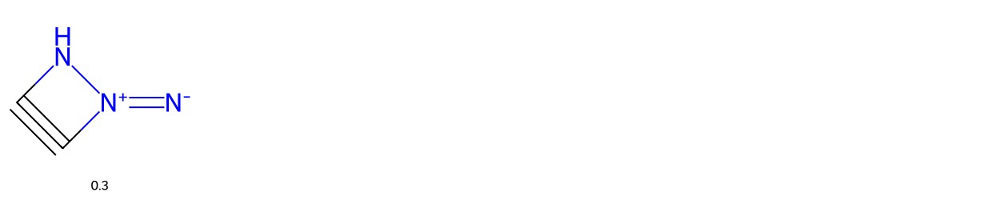

In [197]:
mostrarSmiles(lista_smiles)

In [198]:
df = smiles2dataset(lista_smiles)
print(np.mean(df["QED"].values)) #Media de los valores de QED
print(np.mean(df["LogP"].values)) #Media de los valores de LogP

0.3
-0.543


In [199]:
nombre_archivo = r"DatosExperimentacion\hiv_20_100_6.csv"
df.to_csv(nombre_archivo, index=False)

### Dataset QM9 (15000)

In [209]:
tasks, datasets, transformers = dc.molnet.load_qm9() #Llamamos al objeto molnet.load_dataset dentro de la librería DeepChem
df_qm9 = pd.DataFrame(data={'smiles': datasets[0].ids})

In [212]:
df_qm9_sample = df_qm9.sample(15000, random_state = 123)

In [213]:
df_qm9_sample

,smiles
24348,[H]N1[C@@]([H])(C(=O)C([H])([H])C#N)[C@@]1([H]...
12593,[H]OC([H])([H])[C@@]1([H])C(=O)C(C([H])([H])[H...
73660,[H]C#C[C@@]1([H])C([H])=C(C([H])([H])[H])C([H]...
33427,[H]N1[C@]2(C([H])([H])[H])[C@@]3(OC3([H])[H])C...
14957,[H]C([H])(C#N)N1C(=O)C([H])([H])C1([H])[H]
...,...
40636,[H]C(=O)C([H])([H])N([H])C1(C([H])([H])[H])C([...
26835,[H]C([H])([H])C([H])([H])[C@]1([H])[C@@]2([H])...
80752,[H]C#C[C@@]12O[C@]1([H])C([H])([H])C([H])([H])...
27905,[H]OC([H])([H])[C@]([H])(C#CC([H])=O)O[H]


### Experimento 20: QM9 (15000), 70 épocas, pasos generador 1/5, 12 numero de atómos

In [ ]:
lista_smiles = generar_moleculas_pipeline(df_qm9_sample, epocas = 70, pasos_gen = 1/5, num_atomos = 12)

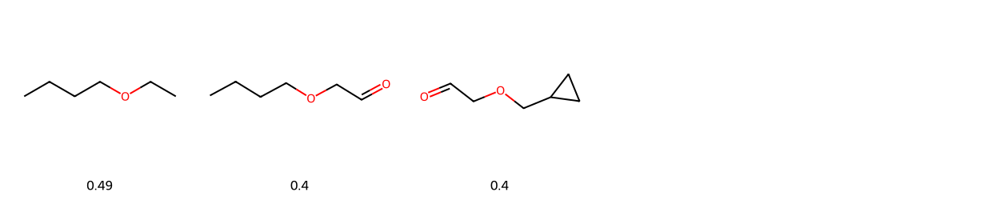

In [215]:
mostrarSmiles(lista_smiles)

In [216]:
df = smiles2dataset(lista_smiles)
print(np.mean(df["QED"].values)) #Media de los valores de QED
print(np.mean(df["LogP"].values)) #Media de los valores de LogP

0.42733333333333334
1.1456666666666668


In [217]:
nombre_archivo = r"DatosExperimentacion\qm9_12_70_5.csv"
df.to_csv(nombre_archivo, index=False)

### Experimentación 21: QM9 (15000), epocas 100, pasos generador 1/6, 12 átomos

In [ ]:
lista_smiles = generar_moleculas_pipeline(df_qm9_sample, epocas = 100, pasos_gen = 1/6, num_atomos = 12)

In [219]:
print(lista_smiles)

['CCC(N)=C(C=O)CO']


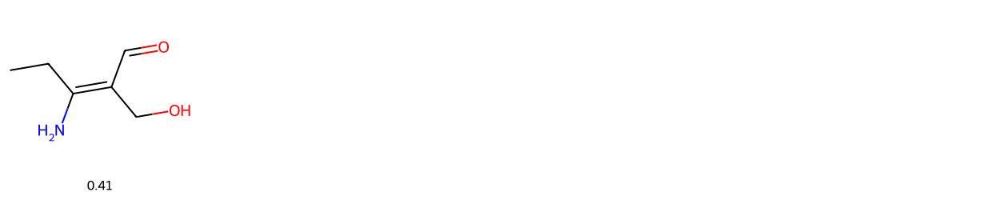

In [220]:
mostrarSmiles(lista_smiles)

In [221]:
df = smiles2dataset(lista_smiles)
print(np.mean(df["QED"].values)) #Media de los valores de QED
print(np.mean(df["LogP"].values)) #Media de los valores de LogP

0.409
-0.2


In [222]:
nombre_archivo = r"DatosExperimentacion\qm9_12_100_6.csv"
df.to_csv(nombre_archivo, index=False)

### Experimentación 22: QM9 (15000), epocas 125, pasos generador 1/6, 12 átomos

In [ ]:
lista_smiles = generar_moleculas_pipeline(df_qm9_sample, epocas = 125, pasos_gen = 1/6, num_atomos = 12)

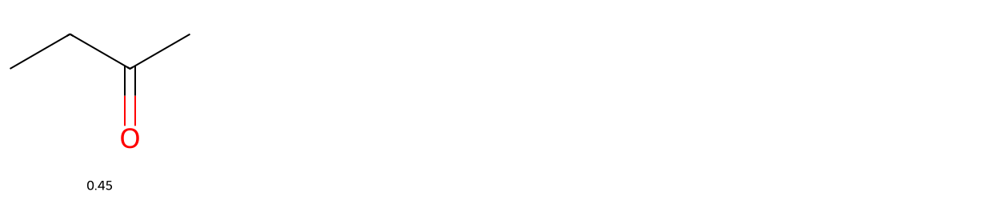

In [229]:
mostrarSmiles(lista_smiles)

In [230]:
df = smiles2dataset(lista_smiles)
print(np.mean(df["QED"].values)) #Media de los valores de QED
print(np.mean(df["LogP"].values)) #Media de los valores de LogP

0.451
0.985


In [231]:
nombre_archivo = r"DatosExperimentacion\qm9_12_125_6.csv"
df.to_csv(nombre_archivo, index=False)

### Dataset QM9 (5000)

In [253]:
tasks, datasets, transformers = dc.molnet.load_qm9() #Llamamos al objeto molnet.load_dataset dentro de la librería DeepChem
df_qm9 = pd.DataFrame(data={'smiles': datasets[0].ids})

In [255]:
df_qm9_sample_5 = df_qm9.sample(5000, random_state = 123)
df_qm9_sample_5

,smiles
24348,[H]N1[C@@]([H])(C(=O)C([H])([H])C#N)[C@@]1([H]...
12593,[H]OC([H])([H])[C@@]1([H])C(=O)C(C([H])([H])[H...
73660,[H]C#C[C@@]1([H])C([H])=C(C([H])([H])[H])C([H]...
33427,[H]N1[C@]2(C([H])([H])[H])[C@@]3(OC3([H])[H])C...
14957,[H]C([H])(C#N)N1C(=O)C([H])([H])C1([H])[H]
...,...
25667,[H]C1=C([H])[C@]([H])(C([H])([H])[H])[C@]2([H]...
98534,[H]OC([H])([H])[C@]1(C([H])=O)OC([H])([H])C1([...
79350,[H]O[C@@]([H])(C(=O)N([H])[H])C([H])([H])C([H]...
39676,[H]C([H])([H])N1C(=O)C([H])([H])[C@@]([H])(C([...


### Experimentación 23: QM9 (5000), epocas 70, pasos generador 1/5, 12 átomos

In [ ]:
lista_smiles = generar_moleculas_pipeline(df_qm9_sample_5, epocas = 70, pasos_gen = 1/5, num_atomos = 12)

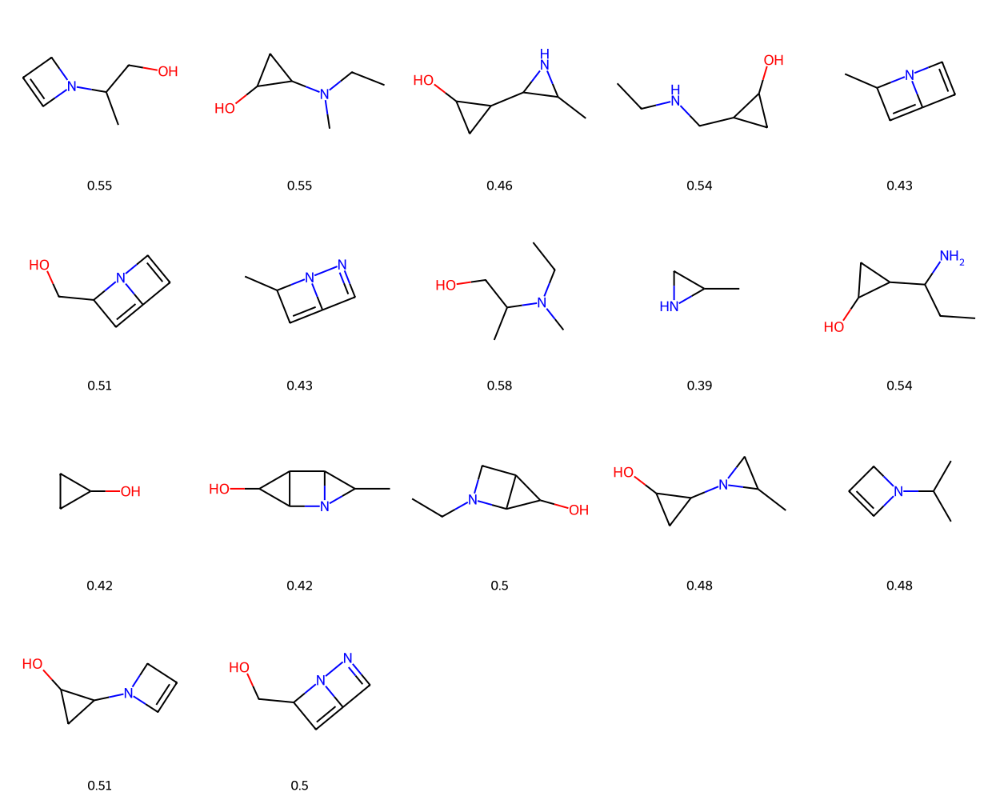

In [270]:
mostrarSmiles(lista_smiles)

In [271]:
df = smiles2dataset(lista_smiles)
print(np.mean(df["QED"].values)) #Media de los valores de QED
print(np.mean(df["LogP"].values)) #Media de los valores de LogP

0.4873529411764706
0.11294117647058821


In [272]:
nombre_archivo = r"DatosExperimentacion\qm9(5000)_12_70_5.csv"
df.to_csv(nombre_archivo, index=False)

### Experimentación 24: QM9 (5000), epocas 100, pasos generador 1/6, 12 átomos

In [ ]:
lista_smiles = generar_moleculas_pipeline(df_qm9_sample_5, epocas = 100, pasos_gen = 1/6, num_atomos = 12)

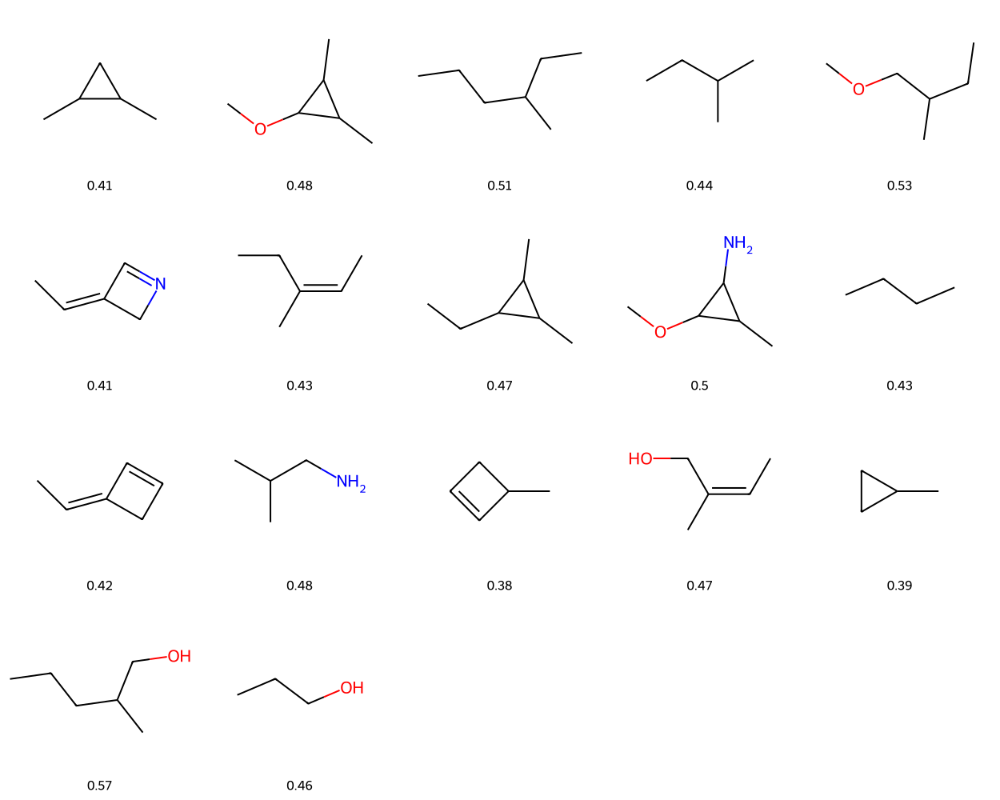

In [263]:
mostrarSmiles(lista_smiles)

In [264]:
df = smiles2dataset(lista_smiles)
print(np.mean(df["QED"].values)) #Media de los valores de QED
print(np.mean(df["LogP"].values)) #Media de los valores de LogP

0.45841176470588235
1.4832941176470587


In [265]:
nombre_archivo = r"DatosExperimentacion\qm9(5000)_12_100_6.csv"
df.to_csv(nombre_archivo, index=False)

### Experimentación 25: QM9 (5000), epocas 125, pasos generador 1/6, 12 átomos

In [ ]:
lista_smiles = generar_moleculas_pipeline(df_qm9_sample_5, epocas = 125, pasos_gen = 1/6, num_atomos = 12)

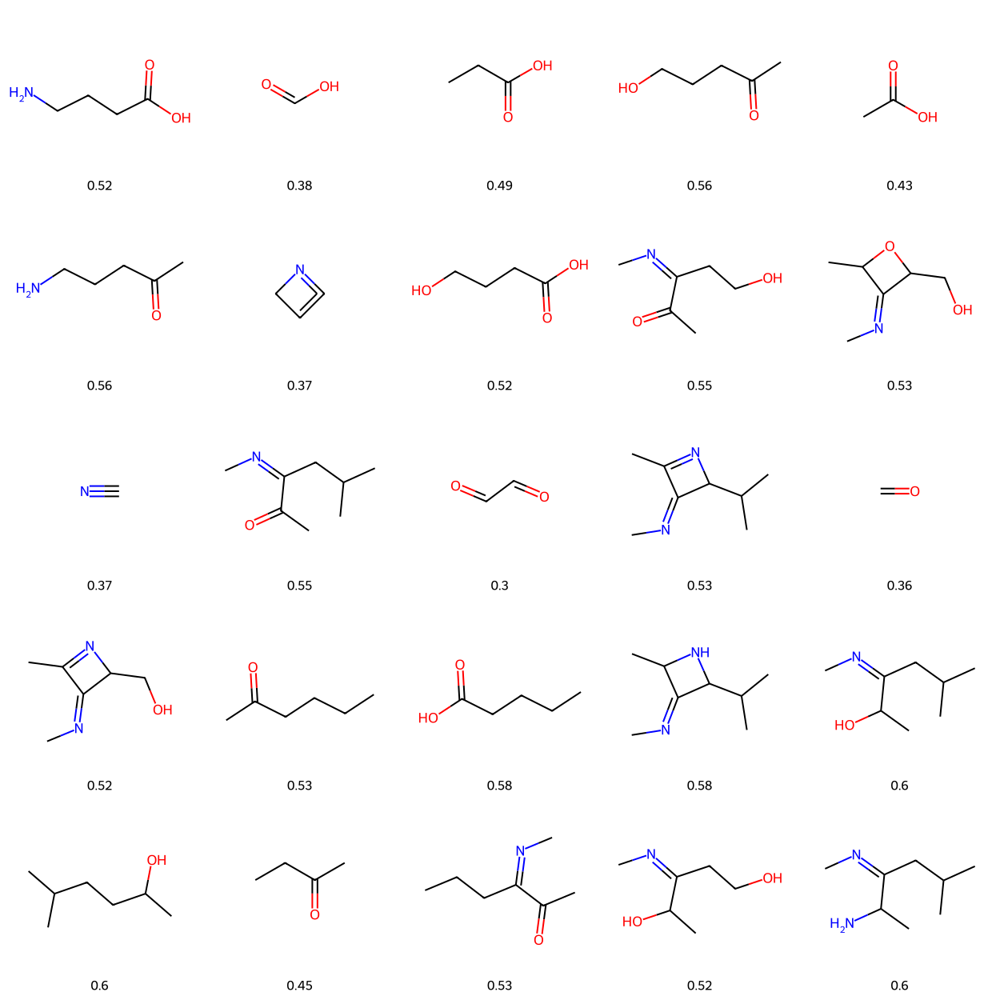

In [276]:
mostrarSmiles(lista_smiles)

In [277]:
df = smiles2dataset(lista_smiles)
print(np.mean(df["QED"].values)) #Media de los valores de QED
print(np.mean(df["LogP"].values)) #Media de los valores de LogP

0.50056
0.57


In [278]:
nombre_archivo = r"DatosExperimentacion\qm9(5000)_12_125_6.csv"
df.to_csv(nombre_archivo, index=False)